In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import gget
from scipy.stats import spearmanr
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from tqdm import tqdm
import os
from scipy.sparse import csr_matrix

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc

import cupy as cp
import cuml

sc.settings.verbosity = 3

# Load the Data

In [2]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
adata = sc.read_h5ad(fpath)

group_map = {
    "C1" : "other",
    "C2" : "reprogram",
    "C3" : "reprogram",
    "C4" : "control",
    "C5" : "control",
}

group_label_map = {
    "C1" : "C1",
    "C2" : "C2",
    "C3" : "C3",
    "C4" : "control",
    "C5" : "control",
}

adata.obs['group'] = adata.obs['cluster_str'].map(group_map)
adata.obs['group_label'] = adata.obs['cluster_str'].map(group_label_map)
print(adata.obs['group'].value_counts())
print()
adata

group
control      9122
reprogram    5911
other         834
Name: count, dtype: int64

CPU times: user 378 ms, sys: 1.86 s, total: 2.24 s
Wall time: 4.27 s


AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'group', 'group_label'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', '

# load SCENIC Matrix

In [3]:
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/data/resources/scenic_resources/500bp_up_100bp_down_B.csv"
df = pd.read_csv(fpath)
df = df.rename(columns={'Unnamed: 0': 'gene_name'})
df = df.set_index('gene_name')

df = df[df.index.isin(adata.var_names)]
print(f"{df.shape=}")
df.head()

df.shape=(14791, 1605)


,ABL1,ACAA1,ADNP,ADNP2,AEBP2,AFF4,AHCTF1,AHDC1,AHR,AHRR,...,ZSCAN32,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN5C,ZSCAN9,ZXDA,ZXDB,ZXDC,ZZZ3
gene_name,,,,,,,,,,,,,,,,,,,,,
A1BG,1.65,0.0,5.060,0.0,0.0,8.470,6.400,2.2900,0.83060,0.0,...,0.0,0.0,0.0,0.0,1.32,1.448,1.790,1.484333,0.0,1.370
A1BG-AS1,0.00,0.0,0.545,0.0,0.0,0.379,0.000,0.0000,0.14640,0.0,...,0.0,0.0,0.0,0.0,0.00,0.770,1.465,1.032333,0.0,0.000
A2M,1.39,0.0,0.827,0.0,0.0,4.700,0.810,1.0550,0.27314,0.0,...,0.0,0.0,0.0,0.0,0.00,0.535,0.885,0.698000,0.0,3.450
A2M-AS1,0.00,0.0,0.000,0.0,0.0,1.450,0.111,0.0000,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.00,0.800,0.000,0.059333,0.0,0.000
A2ML1,2.53,0.0,3.360,0.0,0.0,5.950,3.980,0.8319,0.97060,0.0,...,0.0,0.0,0.0,0.0,0.00,1.815,1.930,1.307833,0.0,0.614


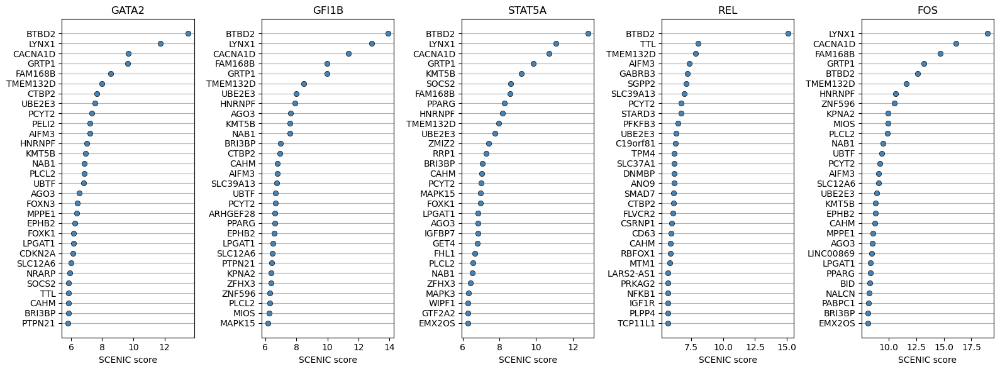

In [4]:
top_n = 30
tf_list = ['GATA2', 'GFI1B', 'STAT5A', 'REL', 'FOS']

fig, axes = plt.subplots(
    nrows=1, ncols=len(tf_list), figsize=(16, 6),
    sharex=False, sharey=False
)

for ax, tf in zip(axes, tf_list):
    top_genes = df[tf].nlargest(top_n)

    sns.scatterplot(
        x=top_genes.values,
        y=top_genes.index,
        ax=ax,
        color='steelblue',
        edgecolor='black',
        zorder=4
    )

    ax.set_title(f'{tf}')
    ax.set_xlabel('SCENIC score')
    ax.set_ylabel('')
    ax.grid(axis='y', zorder=0)

plt.tight_layout()
plt.show()


In [5]:
# compute score fold changes
pdf = df.copy()
pdf = pdf[tf_list]

foldchanges = pdf.copy()

eps = 0.001
print(f"{pdf.shape=}")

# Loop through each column
for col in tf_list:
    # Compute mean of all other columns
    others_mean = pdf.drop(columns=col).mean(axis=1)
    
    # Compute log2 fold change
    foldchanges[col] = np.log2(pdf[col] + eps / others_mean + eps)

foldchanges.head()

pdf.shape=(14791, 5)


,GATA2,GFI1B,STAT5A,REL,FOS
gene_name,,,,,
A1BG,1.103480,1.089483,0.893633,0.463647,1.669792
A1BG-AS1,-4.642616,-4.778303,-3.132386,-2.484718,-6.025452
A2M,-0.615676,-0.373558,0.435480,0.524886,-0.822004
A2M-AS1,-4.376521,-6.638351,-2.397402,-2.220457,-4.477131
A2ML1,1.128097,0.987739,1.234826,0.628303,0.874011


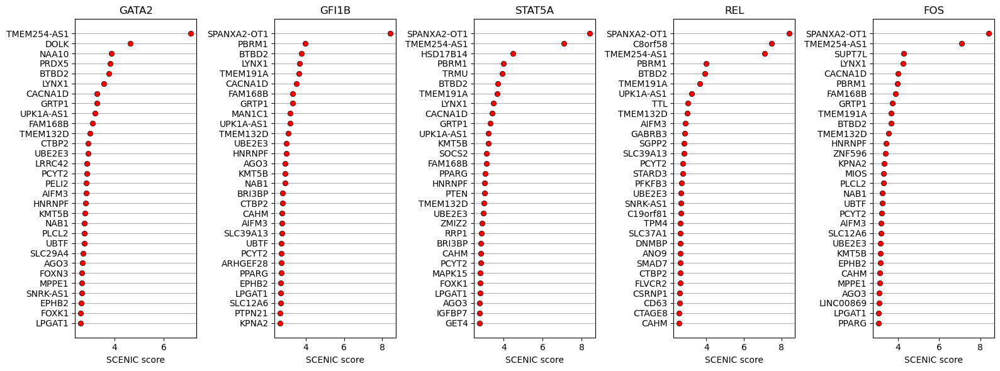

In [6]:
top_n = 30
tf_list = ['GATA2', 'GFI1B', 'STAT5A', 'REL', 'FOS']

fig, axes = plt.subplots(
    nrows=1, ncols=len(tf_list), figsize=(16, 6),
    sharex=False, sharey=False
)

for ax, tf in zip(axes, tf_list):
    valid_values = foldchanges[tf][np.isfinite(foldchanges[tf])]
    top_genes = valid_values.nlargest(top_n)
    sns.scatterplot(
        x=top_genes.values,
        y=top_genes.index,
        ax=ax,
        edgecolor='black',
        zorder=4,
        color='r',
    )

    ax.set_title(f'{tf}')
    ax.set_xlabel('SCENIC score')
    ax.set_ylabel('')
    ax.grid(axis='y', zorder=0)

plt.tight_layout()
plt.show()

pdf.shape=(14791, 1605)


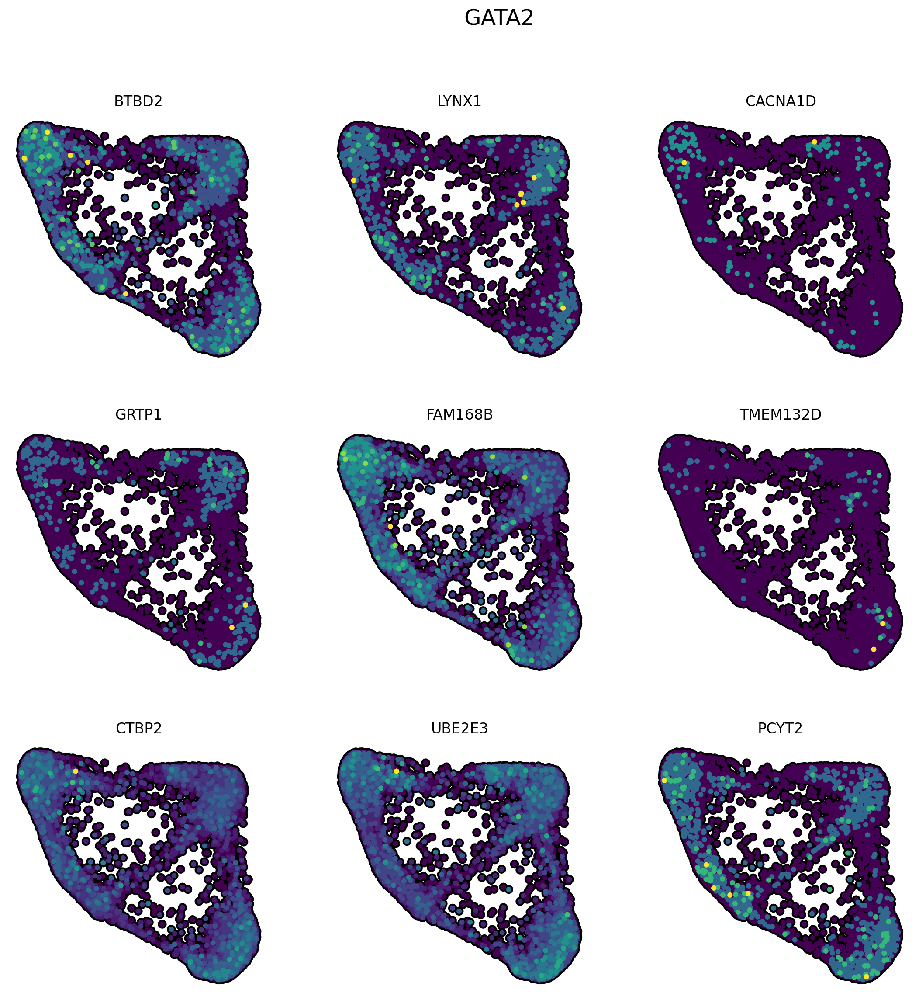

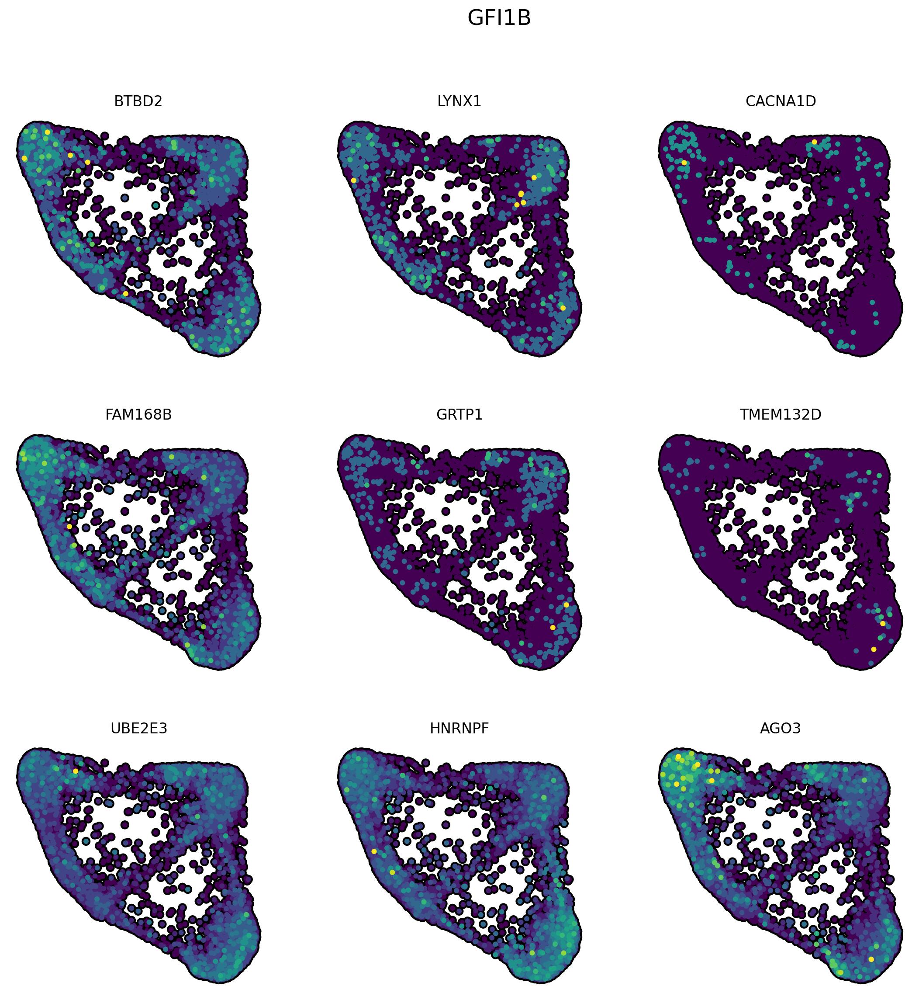

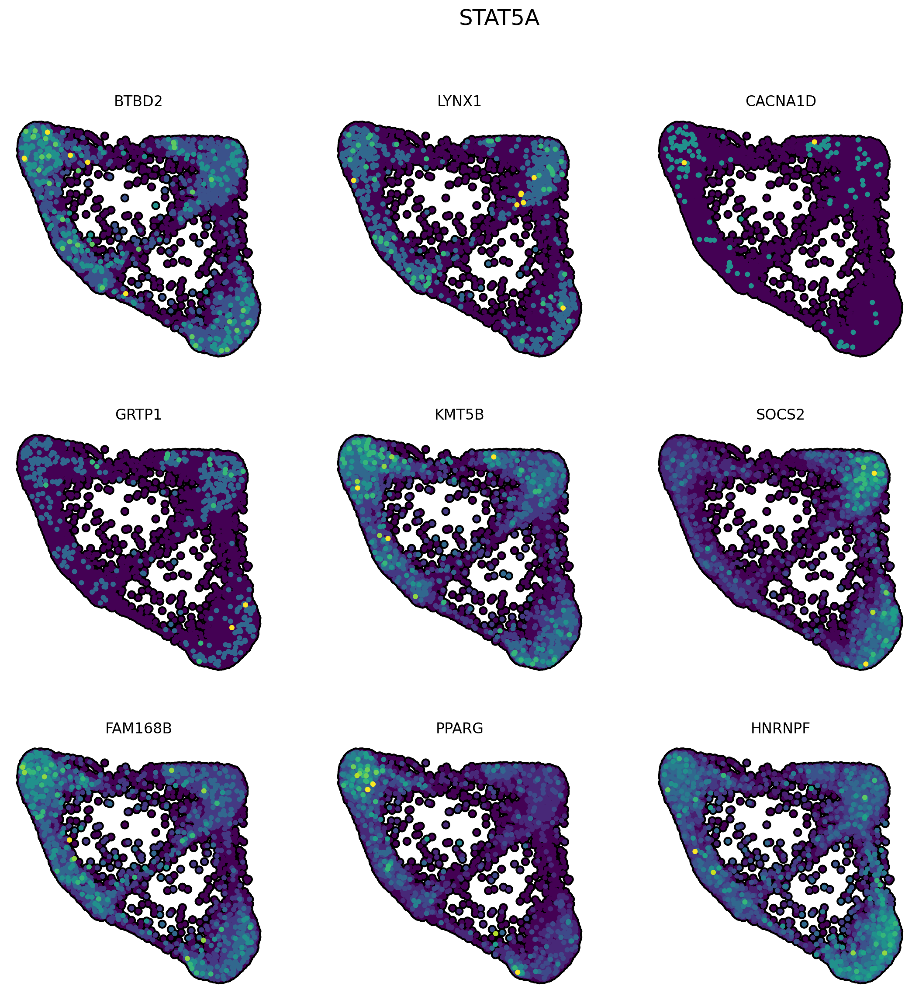

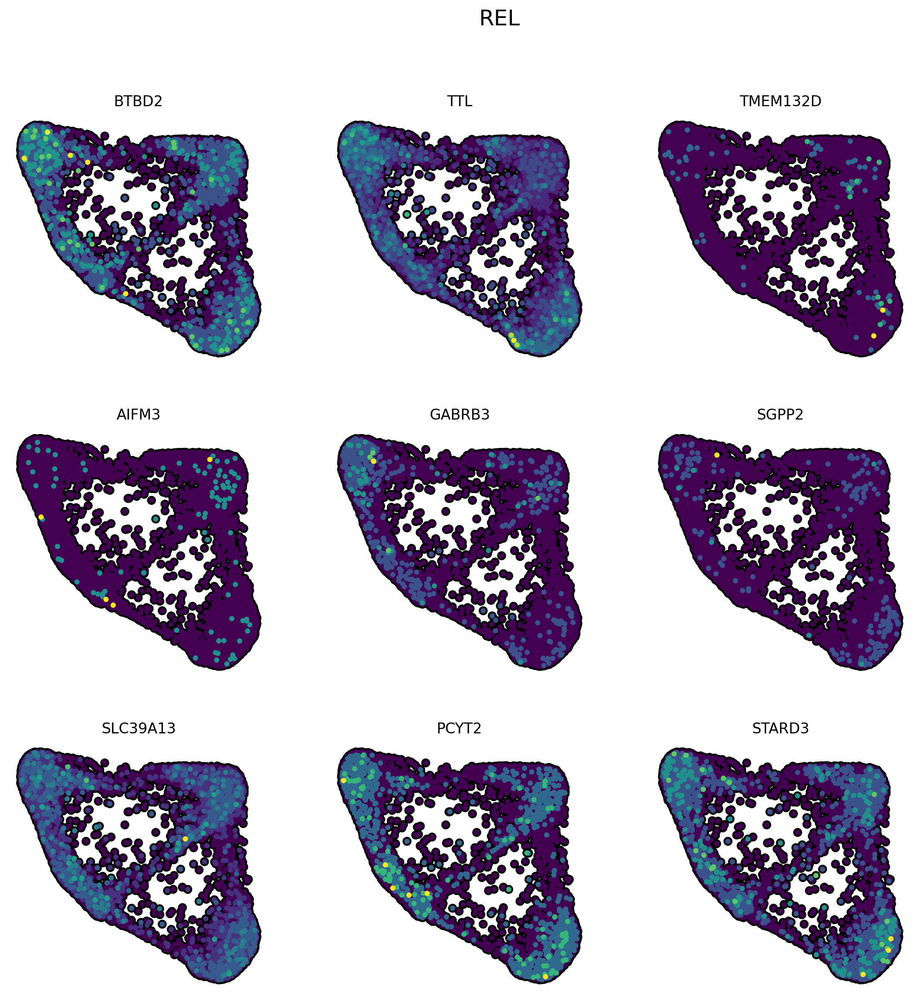

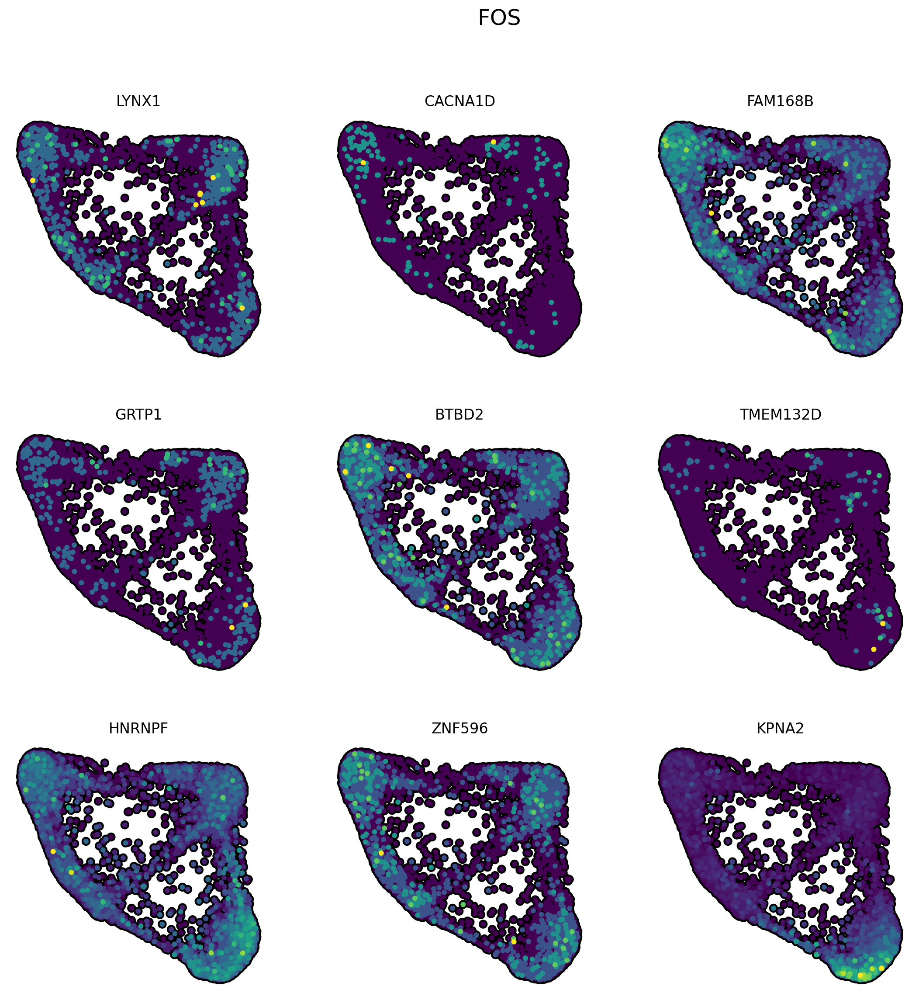

,ABL1,ACAA1,ADNP,ADNP2,AEBP2,AFF4,AHCTF1,AHDC1,AHR,AHRR,...,ZSCAN32,ZSCAN4,ZSCAN5A,ZSCAN5B,ZSCAN5C,ZSCAN9,ZXDA,ZXDB,ZXDC,ZZZ3
gene_name,,,,,,,,,,,,,,,,,,,,,
A1BG,1.65,0.0,5.060,0.0,0.0,8.470,6.400,2.2900,0.83060,0.0,...,0.0,0.0,0.0,0.0,1.32,1.448,1.790,1.484333,0.0,1.370
A1BG-AS1,0.00,0.0,0.545,0.0,0.0,0.379,0.000,0.0000,0.14640,0.0,...,0.0,0.0,0.0,0.0,0.00,0.770,1.465,1.032333,0.0,0.000
A2M,1.39,0.0,0.827,0.0,0.0,4.700,0.810,1.0550,0.27314,0.0,...,0.0,0.0,0.0,0.0,0.00,0.535,0.885,0.698000,0.0,3.450
A2M-AS1,0.00,0.0,0.000,0.0,0.0,1.450,0.111,0.0000,0.00000,0.0,...,0.0,0.0,0.0,0.0,0.00,0.800,0.000,0.059333,0.0,0.000
A2ML1,2.53,0.0,3.360,0.0,0.0,5.950,3.980,0.8319,0.97060,0.0,...,0.0,0.0,0.0,0.0,0.00,1.815,1.930,1.307833,0.0,0.614


In [7]:
top_n = 9

pdf = df.copy()
pdf = pdf[pdf.index.isin(adata.var_names)]
print(f"{pdf.shape=}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3.5, 4

for tf in tf_list:
    top_genes = pdf[tf].nlargest(top_n)

    fig = sc.pl.draw_graph(
        adata,
        ncols=3,
        color=top_genes.index,
        size=75,
        add_outline=True,
        outline_color=('k', 'k'),
        alpha=1,
        frameon=False,
        colorbar_loc=None,
        show=False,
        return_fig=True,
    )
    fig.suptitle(tf, y=0.98, fontsize=18)
    plt.show()

pdf.head()

pdf.shape=(14791, 1605)
computing score 'GATA2_score'
    finished: added
    'GATA2_score', score of gene set (adata.obs).
    1097 total control genes are used. (0:00:01)


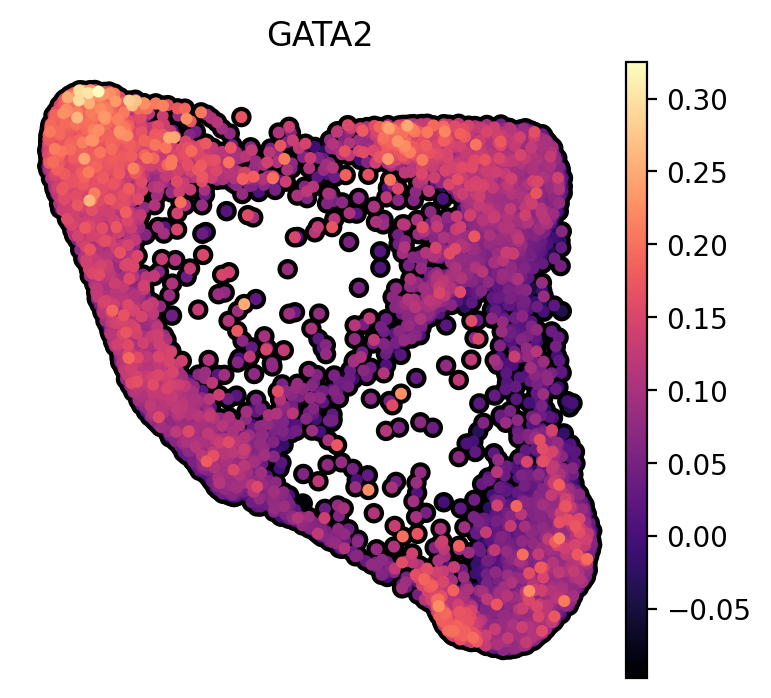

computing score 'GFI1B_score'
    finished: added
    'GFI1B_score', score of gene set (adata.obs).
    1096 total control genes are used. (0:00:01)


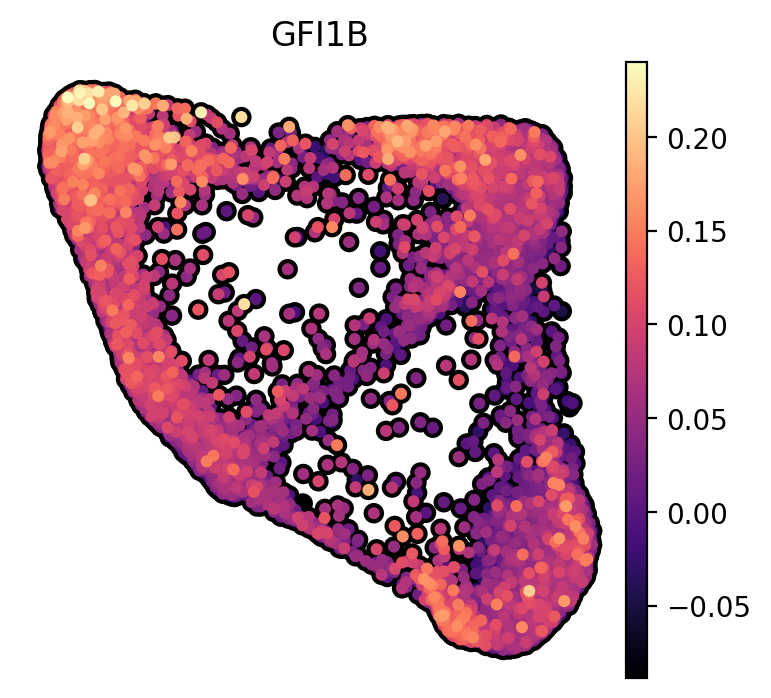

computing score 'STAT5A_score'
    finished: added
    'STAT5A_score', score of gene set (adata.obs).
    1096 total control genes are used. (0:00:01)


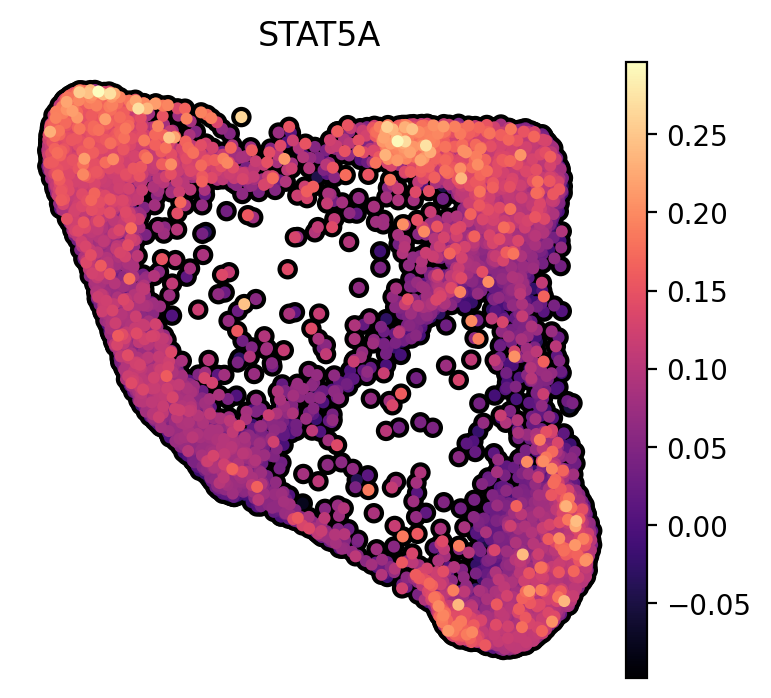

computing score 'REL_score'
    finished: added
    'REL_score', score of gene set (adata.obs).
    1097 total control genes are used. (0:00:01)


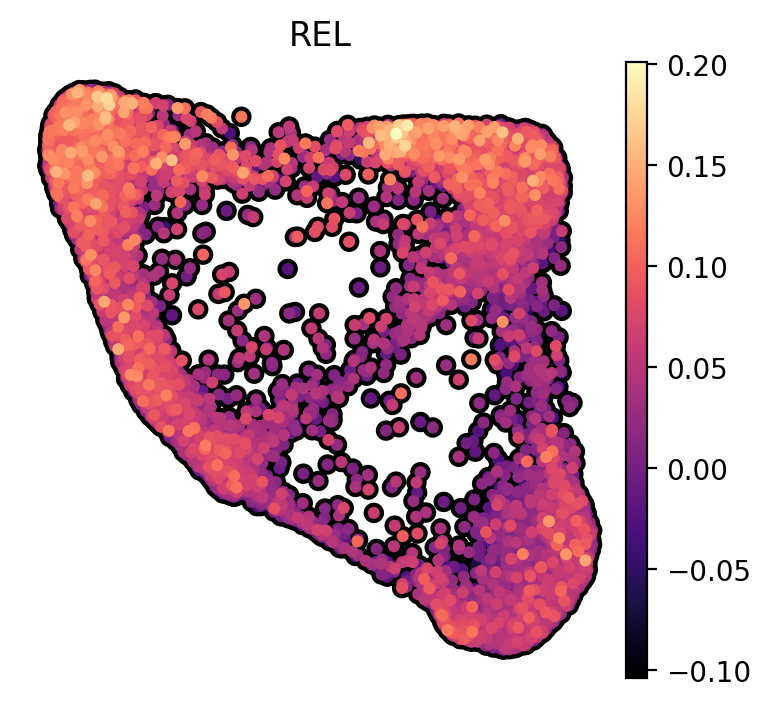

computing score 'FOS_score'
    finished: added
    'FOS_score', score of gene set (adata.obs).
    1144 total control genes are used. (0:00:01)


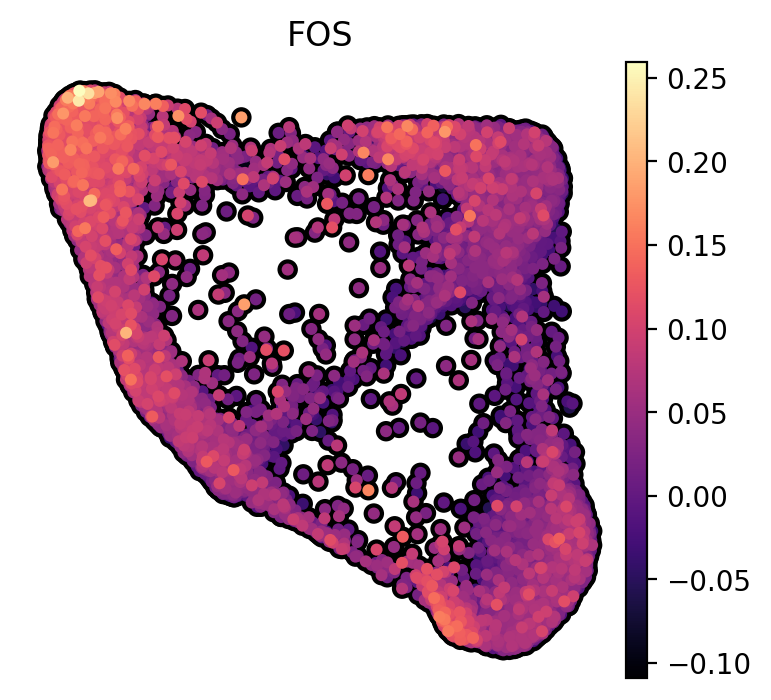

In [8]:
# gene scoring
top_n = 100

pdf = df.copy()
pdf = pdf[pdf.index.isin(adata.var_names)]
print(f"{pdf.shape=}")

score_columns = []

for tf in tf_list:
    top_genes = pdf[tf].nlargest(top_n)

    score_name = f"{tf}_score"
    score_columns.append(score_name)
    
    sc.tl.score_genes(
        adata, gene_list=top_genes.index,
        score_name=score_name,
        layer='log_norm',
    )

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 4.25, 4
    
    sc.pl.draw_graph(
        adata,
        ncols=3,
        color=score_name,
        size=75,
        add_outline=True,
        cmap='magma',
        outline_color=('k', 'k'),
        title=tf,
        alpha=1,
        frameon=False,
    )

# Differential Expression

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


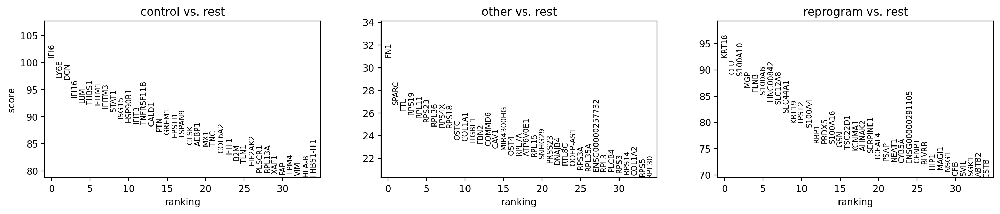

CPU times: user 25.5 s, sys: 13.6 s, total: 39.1 s
Wall time: 12.6 s


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,control,IFI6,100.965279,5.434073,0.0,0.0,0.969524,0.461379
1,control,LY6E,97.310684,2.864794,0.0,0.0,0.985201,0.714455
2,control,DCN,96.880852,5.223413,0.0,0.0,0.952861,0.185174
3,control,IFI16,93.546204,4.487603,0.0,0.0,0.925126,0.234248
4,control,LUM,92.523422,4.648037,0.0,0.0,0.932800,0.144107


In [9]:
%%time
rsc.get.anndata_to_CPU(adata)
sc.tl.rank_genes_groups(
    adata, 
    groupby='group',
    method='wilcoxon',
    use_raw=False,
    pts=True,
)

deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
    pval_cutoff=0.05,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 3
sc.pl.rank_genes_groups(
    adata,
    n_genes=35,
    sharey=False,
    ncols=3,
)

deg.head()

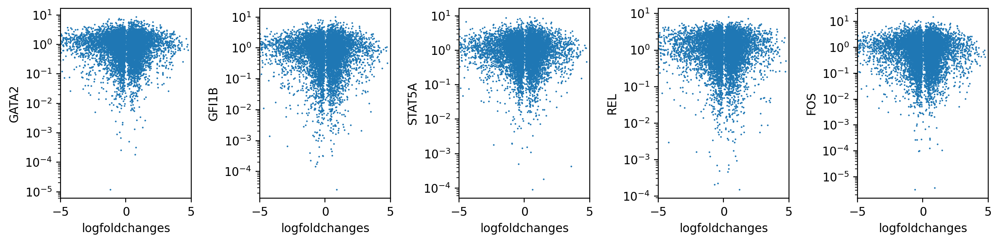

In [10]:
pdf = df.copy()
pdf = pdf[tf_list].reset_index()

pdf = pd.merge(
    deg[deg['group'] == 'reprogram'],
    pdf,
    how='left',
    right_on='gene_name',
    left_on='names',
)

tf_list = ['GATA2', 'GFI1B', 'STAT5A', 'REL', 'FOS']

fig, axes = plt.subplots(
    nrows=1, ncols=len(tf_list), figsize=(12, 3),
    sharex=False, sharey=False
)

for ax, tf in zip(axes, tf_list):

    sns.scatterplot(
        data=pdf,
        x='logfoldchanges',
        y=tf,
        ax=ax,
        s=2,
        ec='none',
    )

    ax.set_yscale('log')
    ax.set_xlim([-5, 5])


plt.tight_layout()

In [11]:
# Specify relevant columns
cols = ['logfoldchanges', 'GATA2', 'GFI1B', 'STAT5A', 'REL', 'FOS']

# Choose the percentile threshold
p = 0.65

# Compute thresholds
thresholds = pdf[cols].quantile(p)

# Find rows where all specified columns are above their thresholds
mask = (pdf[cols] >= thresholds).all(axis=1)

# Get matching rows
high_rows = pdf[mask].reset_index(drop=True)
print(f"{high_rows.shape=}")

high_rows['sum_score'] = high_rows[cols].sum(axis=1)
high_rows = high_rows.sort_values(by='sum_score', ascending=False)
print(high_rows[['names', 'logfoldchanges', 'pct_nz_group', 'pct_nz_reference', 'GATA2', 'GFI1B', 'STAT5A', 'REL', 'FOS']].head(35).to_string(index=False))

high_rows.shape=(465, 14)
   names  logfoldchanges  pct_nz_group  pct_nz_reference    GATA2    GFI1B   STAT5A      REL       FOS
 FAM168B        0.797779      0.321773          0.223383 8.558070 9.981696 8.572791 4.524867 14.689265
    AGO3        0.790484      0.473693          0.348232 6.513823 7.635878 6.826666 3.595867  8.522808
  BRI3BP        0.859275      0.086957          0.053435 5.823226 6.975113 7.060000 4.786267  8.153819
   PPARG        1.426089      0.317205          0.147047 5.061442 6.599131 8.275001 3.628733  8.346412
 SLC12A6        1.170963      0.163932          0.076838 5.999866 6.466270 6.186291 3.606600  9.088886
   ZFHX3        2.070212      0.862629          0.523604 5.730654 6.360452 6.421042 3.524400  7.351401
  NFATC1        1.664537      0.059212          0.019888 4.955118 5.775896 6.030083 4.976000  7.430542
   FOXN3        1.389100      0.632549          0.362495 6.396020 5.491038 4.605500 3.735000  7.852640
   MPPE1        0.668453      0.244629         

In [12]:
(high_rows['names'].unique())

array(['FAM168B', 'AGO3', 'BRI3BP', 'PPARG', 'SLC12A6', 'ZFHX3', 'NFATC1',
       'FOXN3', 'MPPE1', 'FOXK1', 'ZMIZ2', 'PTPN21', 'TCP11L1', 'ABLIM1',
       'RAB6A', 'BCL2L1', 'NALCN', 'SEH1L', 'KCNMA1', 'STXBP6', 'NOD1',
       'USP3-AS1', 'ICA1L', 'PDE4D', 'MTSS1', 'CCT6P3', 'KLHL8',
       'RABGAP1L', 'TTC7A', 'ARID3A', 'PSMG4', 'DNMBP', 'STXBP5',
       'KIAA0513', 'NCOA6', 'CXXC5', 'SESN1', 'DENND5B', 'MAPT', 'NOS1AP',
       'TSC22D1', 'TET2', 'ZFP30', 'PRKAG2', 'AGAP3', 'VGLL4', 'SOX5',
       'VKORC1L1', 'CYTH1', 'GABRB3', 'BCAR3', 'CBFA2T2', 'SVIL',
       'NBEAL1', 'DCHS2', 'ST3GAL6', 'ACSL1', 'ANXA4', 'FLVCR2',
       'DCUN1D1', 'TGFBRAP1', 'STRA6', 'FECH', 'GSN', 'ZNF767P', 'SORBS2',
       'TCAIM', 'PRKX', 'HIPK3', 'TPD52', 'TLE3', 'TRAK1', 'INPP4A',
       'TSHZ1', 'SHANK2', 'SLC24A4', 'PDE8A', 'RERE', 'SERGEF', 'CRLS1',
       'PDPN', 'MTM1', 'SEC14L1', 'MFHAS1', 'SGK1', 'SLC35F3', 'NCOA2',
       'SATB2', 'SYNM', 'DLG2', 'KAT2B', 'FLCN', 'ASAP1', 'SSH2',
       'IGFBP6',

In [18]:
edf = gget.enrichr(high_rows['names'], database='ontology')
edf = edf[edf['adj_p_val'] < 0.05]
edf = edf[['path_name', 'overlapping_genes']]
edf

12:06:19 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


,path_name,overlapping_genes
0,phosphorylation (GO:0016310),"[ALK, DGKD, MAST2, PRKAG2, LIMD1, ACVR1B, HK1,..."
1,protein phosphorylation (GO:0006468),"[DDR1, ALK, MAST2, PRKAG2, PRKX, ACVR1B, EGFR,..."
2,cellular protein modification process (GO:0006...,"[MAST2, DCUN1D3, DCUN1D1, PTPN21, PRKAG2, DCAF..."
3,regulation of cation channel activity (GO:2001...,"[CACNB2, JPH2, DLG1, CACNB4, DLG2, FGF14, PDE4..."


# Plot some

pdf.shape=(25, 14)


Text(0.5, 73.44444444444441, '')

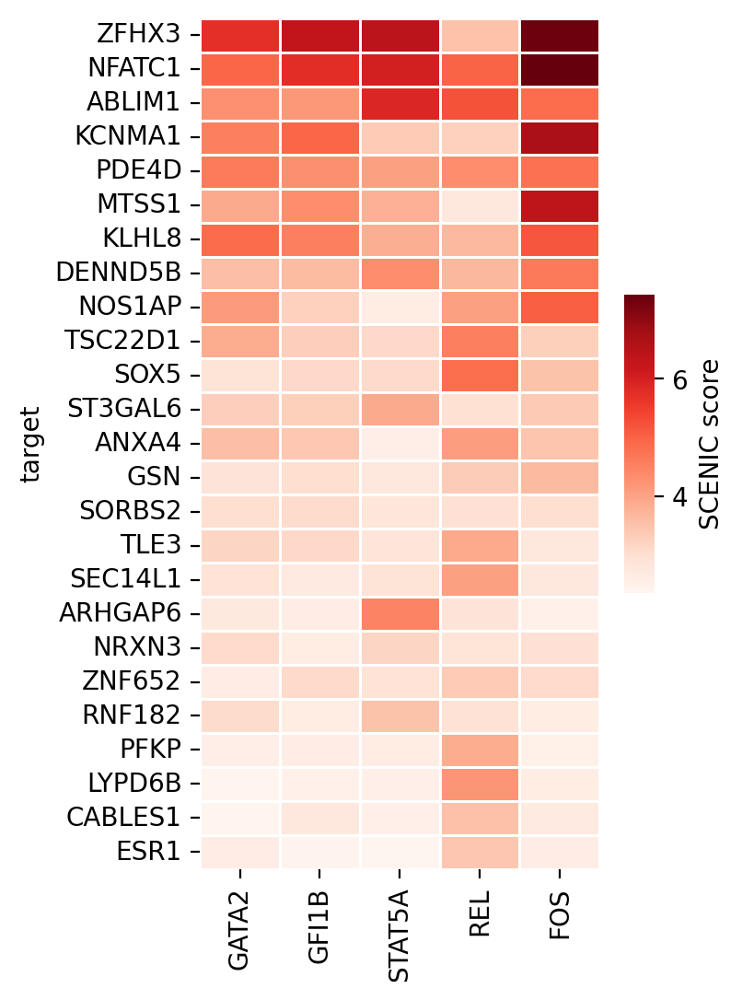

In [56]:
# Choose the percentile threshold
p = 0.90

pdf = df.copy()
pdf = pdf[tf_list].reset_index()

pdf = pd.merge(
    deg[deg['group'] == 'reprogram'],
    pdf,
    how='left',
    right_on='gene_name',
    left_on='names',
)


# Compute thresholds
thresholds = pdf[cols].quantile(p)

# Find rows where all specified columns are above their thresholds
mask = (pdf[cols] >= thresholds).all(axis=1)

# Get matching rows
pdf = pdf[mask].reset_index(drop=True)
print(f"{pdf.shape=}")

pdf['sum_score'] = pdf[cols].sum(axis=1)
pdf = pdf.sort_values(by='sum_score', ascending=False)
pdf = pdf.set_index('names')
pdf = pdf[tf_list]

sns.heatmap(
    pdf,
    cmap="Reds",
    lw=1,
    cbar_kws={'shrink' : 0.35, 'aspect' : 10, 'label' : 'SCENIC score'}
)

plt.ylabel("target")
plt.xlabel("")